In [1]:
import time
import numpy as np
import cv2
import pandas as pd
import os, errno
import matplotlib.pyplot as plt

In [39]:
def erodeimg(image):
    kernel = np.ones((4,4), np.uint8)
    erode = cv2.erode(image, kernel, iterations = 1)
    return erode

In [40]:
def dilateimg(image):
    kernel = np.ones((4,4), np.uint8)
    dilate = cv2.dilate(image, kernel, iterations = 1)
    return dilate

In [61]:
def pix_count(image):
    real = image[image>5]
    pixels = len(real)
    return pixels

In [62]:
def MotionParameters(image):
    eroded = erodeimg(image)
    dilated = dilateimg(eroded)


    mask = cv2.inRange(dilated, 5, 200)
    kernel = np.ones((10,10), np.uint8)
    close = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    _, contours, hierarchy = cv2.findContours(close, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    areas = [cv2.contourArea(c) for c in contours]
    
    if (len(contours) >= 1) & np.any(areas):
        max_i = np.argmax(areas)
        contour_ = contours[max_i]
        contour_h = cv2.convexHull(contour_)
        
        M = cv2.moments(contour_)
        hM = cv2.moments(contour_h)
        centroid_ = (int(M["m10"]/M["m00"])), (int(M["m01"]/M["m00"]))
        centroid_h = (int(hM["m10"]/hM["m00"])), (int(hM["m01"]/hM["m00"]))
    else:
        contour_ = ()
        contour_h = ()
        centroid_ = (np.nan, np.nan)
        centroid_h = (np.nan, np.nan)
    return contour_, contour_h, centroid_, centroid_h

In [63]:
def VideoList(path):
    video_list = [(os.path.join(root, file), file[0:-4]) 
            for root, dirs, files in os.walk(path) 
            for file in files 
            if file.endswith('.mp4')]
    return video_list

In [64]:
def VideoPull(back_frame, current_frame, file_name, path):
    video = [(os.path.join(root, file), file[0:-4]) 
        for root, dirs, files in os.walk(path) 
        for file in files 
        if file.endswith(file_name + '.mp4')]
    cam = cv2.VideoCapture(video[0][0])
    cam.set(1,back_frame)
    ret, f = cam.read(1)
    background = cv2.cvtColor(f, cv2.COLOR_BGR2GRAY)
    cam.set(1,current_frame)
    ret, c = cam.read(1)
    current = cv2.cvtColor(c, cv2.COLOR_BGR2GRAY)
    difference = cv2.subtract(current,background)

    return background, current, difference

In [65]:
path = r"C:\Users\Daniellab\Desktop\Light_level_videos_second_batch"
output_path = r'C:\Users\Daniellab\Desktop\Light_level_videos_second_batch\Data\Step1'

In [66]:
video_list = VideoList(path)
video_list[8]

('C:\\Users\\Daniellab\\Desktop\\Light_level_videos_second_batch\\2019_07_10\\L50_c-3_m6.mp4',
 'L50_c-3_m6')

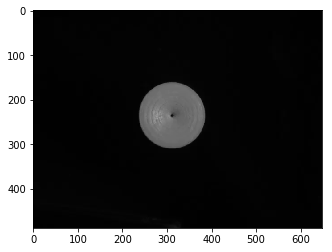

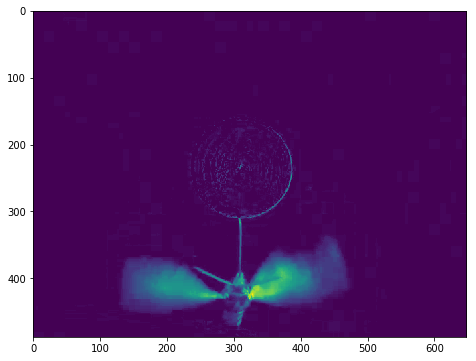

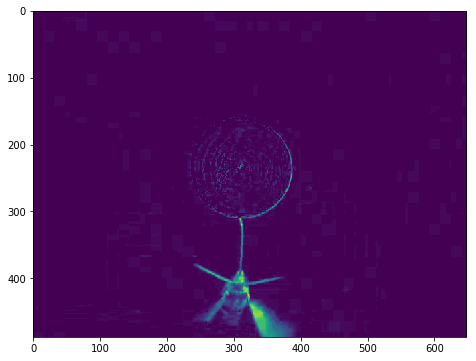

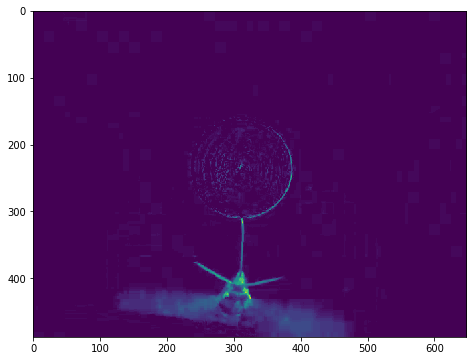

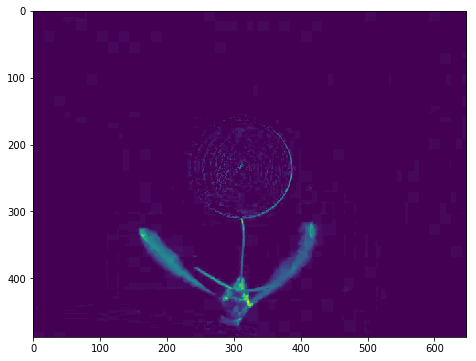

...

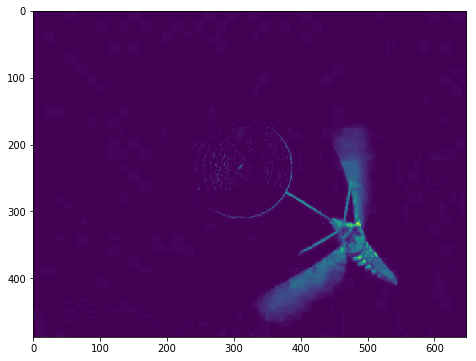

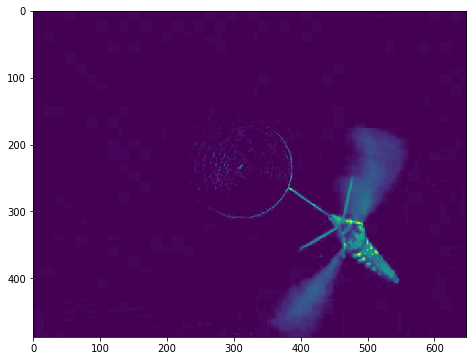

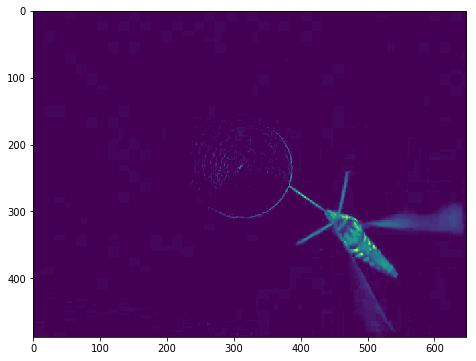

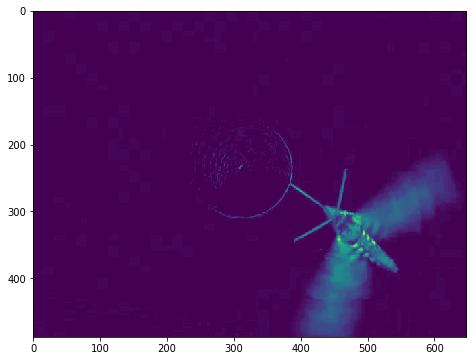

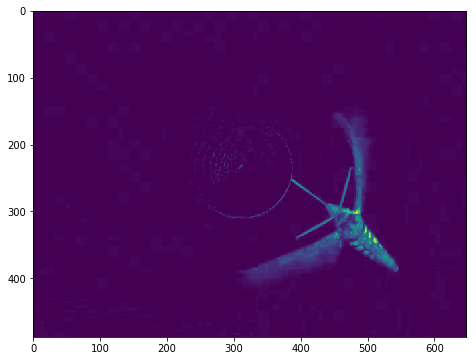

In [67]:
video = video_list[8]
t0 = time.time()
cam_ = video[0]
name = video[1]

cam = cv2.VideoCapture(cam_)
back_frame = 0
cam.set(1, back_frame)
ret, f = cam.read(1)

plt.imshow(f)
if not ret:
     with open(os.path.join(output_path, 'Logfile.txt'), 'a') as file1:
        file1.write(name + '\t' + ' did not load on' + '\t' + '\t' + str(time.asctime()) + '\n')
else:
    with open(os.path.join(output_path, 'Logfile.txt'), 'a') as file1:
        file1.write(name + '\t' + ' loaded successfully on' + '\t' + '\t' + str(time.asctime()) + '\n')
    frames = list(range(0,int(cam.get(cv2.CAP_PROP_FRAME_COUNT))))
    start_frame = 23995
    end_frame = 24500
    frameNum = frames[start_frame:end_frame]
    contours = []
    centroids_x = []
    centroids_y = []
    contours_hull = []
    centroids_hull_x = []
    centroids_hull_y = []
    pixels_per_frame = []

    for frame in frameNum:
        back, cur, diff = VideoPull(0,frame, name, path)
        fig = plt.figure(figsize = (20,6))
        if np.any(diff) == False:
            with open(os.path.join(output_path, 'Logfile.txt'), 'a') as file1:
                file1.write(name + '\t' + ' frame lost:' + '\t' + str(frame) + '\t' + 'on ' + str(time.asctime()) + '\n')
        contour, contour_hull, centroid, centroid_hull = MotionParameters(diff)
        if len(contour) >= 1:
            pix = pix_count(diff)
            
            pixels_per_frame.append(pix)
#                 contours.append(contour)
            centroids_x.append(centroid[0])
            centroids_y.append(centroid[1])
#                 contours_hull.append(contour_hull)
            centroids_hull_x.append(centroid_hull[0])
            centroids_hull_y.append(centroid_hull[1])
        plt.imshow(diff) 
# t1 = time.time()
# dt = t1-t0
# with open(os.path.join(output_path, 'Logfile.txt'), 'a') as file1:
#     file1.write(name + '\t' + ' took '+ '\t' + str(dt) + '\t' +'seconds to complete' + '\n')

# df = pd.DataFrame({'pixel': pixels_per_frame,
#                  'Cent_x': centroids_x,
#                   'Cent_y': centroids_y,
#                   'Cent_hx': centroids_hull_x,
#                   'Cent_hy': centroids_hull_y})
# df.to_csv(output_path + '/' + name + '_rawData.csv')

In [68]:
pixels_per_frame

[22090,
 6395,
 13467,
 9607,
 19333,
 5020,
 11928,
 14407,
 9104,
 5115,
 7098,
 13315,
 12466,
 4376,
 8989,
 20239,
 5441,
 4759,
 7173,
 21275,
 4606,
 5165,
 7267,
 17676,
 3779,
 7035,
 7616,
 17093,
 4173,
 8599,
 10511,
 13457,
 4131,
 8724,
 14197,
 11799,
 4914,
 7563,
 18247,
 6934,
 4254,
 9885,
 15883,
 5796,
 10220,
 8407,
 15085,
 6523,
 10007,
 8053,
 16805,
 5398,
 11708,
 17223,
 10065,
 7234,
 6779,
 20935,
 5719,
 10940,
 13128,
 15796,
 7449,
 10043,
 21747,
 7213,
 7290,
 8318,
 21605,
 6144,
 8734,
 8874,
 20928,
 6847,
 6882,
 11033,
 19131,
 6562,
 14147,
 20908,
 7617,
 12833,
 13135,
 16132,
 4732,
 12794,
 11197,
 11342,
 5186,
 19252,
 14910,
 9995,
 7086,
 16317,
 17654,
 11945,
 6498,
 11594,
 12592,
 18830,
 6890,
 11676,
 14934,
 18889,
 8808,
 12098,
 19740,
 7158,
 15370,
 16942,
 13628,
 6506,
 16654,
 18963,
 8428,
 7416,
 16200,
 17990,
 7646,
 15569,
 11261,
 18236,
 6825,
 17433,
 20658,
 11473,
 9691,
 13198,
 24149,
 8378,
 11958,
 16090,
 211

In [134]:
for video in video_list:
    t0 = time.time()
    cam_ = video[0]
    name = video[1]
    
    cam = cv2.VideoCapture(cam_)
    back_frame = 0
    cam.set(1, back_frame)
    ret, f = cam.read(1)
    
    if not ret:
         with open(os.path.join(output_path, 'Logfile.txt'), 'a') as file1:
            file1.write(name + '\t' + ' did not load on' + '\t' + '\t' + str(time.asctime()) + '\n')
    else:
        with open(os.path.join(output_path, 'Logfile.txt'), 'a') as file1:
            file1.write(name + '\t' + ' loaded successfully on' + '\t' + '\t' + str(time.asctime()) + '\n')
        frames = list(range(0,int(cam.get(cv2.CAP_PROP_FRAME_COUNT))))
        start_frame = 31000
        end_frame = 31015
        frameNum = frames[start_frame:end_frame]
        contours = []
        centroids_x = []
        centroids_y = []
        contours_hull = []
        centroids_hull_x = []
        centroids_hull_y = []
        pixels_per_frame = []
        
        for frame in frameNum:
            back, cur, diff = VideoPull(0,frame, name, path)
            if np.any(diff) == False:
                with open(os.path.join(output_path, 'Logfile.txt'), 'a') as file1:
                    file1.write(name + '\t' + ' frame lost:' + '\t' + str(frame) + '\t' + 'on ' + str(time.asctime()) + '\n')
            contour, contour_hull, centroid, centroid_hull = MotionParameters(diff)
            if len(contour) >= 1:
                pix = pix_count(diff) 
                pixels_per_frame.append(pix)
#                 contours.append(contour)
                centroids_x.append(centroid[0])
                centroids_y.append(centroid[1])
#                 contours_hull.append(contour_hull)
                centroids_hull_x.append(centroid_hull[0])
                centroids_hull_y.append(centroid_hull[1])
       
    t1 = time.time()
    dt = t1-t0
    with open(os.path.join(output_path, 'Logfile.txt'), 'a') as file1:
        file1.write(name + '\t' + ' took '+ '\t' + str(dt) + '\t' +'seconds to complete' + '\n')
                    
    df = pd.DataFrame({'pixel': pixels_per_frame,
                     'Cent_x': centroids_x,
                      'Cent_y': centroids_y,
                      'Cent_hx': centroids_hull_x,
                      'Cent_hy': centroids_hull_y})
    df.to_csv(output_path + '/' + name + '_rawData.csv')

numpy.ndarray

In [77]:
pixels_per_frame

[665, 1110, 685, 1058, 1370, 1277, 1081, 1348, 1202]